# Поиск изображений по текстовому описанию

**Описание проекта** \
Фотохостинг для профессиональных фотографов «Со Смыслом» (“With Sense”) планирует запустить поиск изображений по текстовому описанию (сцены/сюжета). Для защиты проекта перед руководством требуется подготовка PoC(proof of concept), демонстрирующий практическую осуществимость. В проекте предусмотрены юридические ограничения по возрасту людей на изображениях.

**Цель** \
Создать PoC-модель сопоставления «текст ↔ изображение».
- получить эмбеддинги текста и векторы изображений
- обучить модель предсказывающую экспертную оценку соответствия (число от 0 до 1)
- продемонстрировать качество на тесте и базовую функцию поиска «по запросу вернуть самое релевантное изображение» с учётом юридических ограничений.

**Описание данных:**

- `train_dataset.csv` - имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

- `train_images` -  изображения для тренировки модели.

- `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга.

Номера колонок и соответствующий тип данных:
1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

- `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

- `test_queries.csv` -  информация, необходимая для тестирования поп аналогии с `train_dataset.csv`.

- `test_images` - изображения для тестирования модели.

In [ ]:
import os
import sys
import re
import zipfile
import random
import wget
import textwrap
import itertools
from math import ceil
from typing import Set, List, Dict, Any

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from torch.utils.data import TensorDataset, DataLoader

import optuna
from optuna.samplers import TPESampler

from transformers import AutoTokenizer, AutoModel
from transformers import CLIPModel, CLIPProcessor

from sklearn.metrics import mean_squared_error
from sklearn.base import clone
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.preprocessing import Normalizer
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GroupShuffleSplit

tqdm.pandas()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

RANDOM_STATE = 42
MODEL_NAME = 'sentence-transformers/all-MiniLM-L6-v2'
CLIP_NAME = 'openai/clip-vit-base-patch32'

# --- пути/файлы ---
URL = 'CONFIDENTIAL'
PATH = Path.cwd() / 'to_upload'
CACHE = Path('_data_cache'); CACHE.mkdir(exist_ok=True)
ZIP_PATH = CACHE / 'dsplus_integrated_project_4.zip'

NEED_FILES = [
    PATH/'train_dataset.csv',
    PATH/'CrowdAnnotations.tsv',
    PATH/'ExpertAnnotations.tsv',
    PATH/'test_queries.csv'
]
# --- стоп-слова ---
BAD_TERMS = {
    'baby', 'babies', 'newborn', 'infant', 'toddler',
    'child', 'children', 'kid', 'kids',
    'boy', 'boys', 'girl', 'girls',
    'schoolboy', 'schoolgirl', 'pupil',
    'teen', 'teenage', 'teenager', 'teenagers',
    'preschooler', 'kindergartner', 'kindergarten', 'junior', 'youth'
}

print('Импорты/настройки/данные готовы.')


Импорты/настройки/данные готовы.


## 1. Исследовательский анализ данных

Датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения. В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Необходимо агрегировать эти оценки — превратить в одну. Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Перед агрегированием оценок изучим данные. Загрузим их по соответствующей ссылке или откроем локально.


In [ ]:
if not all(file.exists() for file in NEED_FILES):
    print('Локальных файлов нет — скачиваю и распаковываю…')
    wget.download(URL, out=str(ZIP_PATH))
    with zipfile.ZipFile(ZIP_PATH, "r") as zf:
        zf.extractall(Path.cwd())
    print(f'Распаковано в: {Path.cwd().resolve()}')
else:
    print('Файлы найдены локально:', *[str(file) for file in NEED_FILES], sep="\n")

Локальных файлов нет — скачиваю и распаковываю…
Распаковано в: /content


In [2]:
train_df = pd.read_csv(PATH/'train_dataset.csv')
crowd_df = pd.read_csv(PATH/'CrowdAnnotations.tsv', sep='\t', header=None,
                        names=['image','query_id','crowd_share','crowd_yes','crowd_no'])
expert_df = pd.read_csv(PATH/'ExpertAnnotations.tsv', sep='\t', header=None,
                            names=['image','query_id','exp1','exp2','exp3'])
test_df = pd.read_csv(PATH/'test_queries.csv', sep='|', index_col=0)

Посмотрим общую информацию о данных в каждом файле.

In [3]:
def data_info(df: pd.DataFrame, name: str | None = None):
    '''
    Общая информация о таблице. Разведывательный анализ данных.

    Параметры
    ---------
    data : pandas.DataFrame
        Датасет с признаками.
    name : str, optional
        Имя таблицы
    '''
    print(f'== {name} ==')
    display(df.head())
    print('Кол-во пропущенных значений:\n', df.isna().sum())
    print('Кол-во явных дубликатов:', df.duplicated().sum())
    print('Размер выборки:', df.shape)
    print('Кол-во уникальных фото:', len(df['image'].unique()))

In [4]:
data_info(train_df, 'train')

== train ==


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Кол-во пропущенных значений:
 image         0
query_id      0
query_text    0
dtype: int64
Кол-во явных дубликатов: 0
Размер выборки: (5822, 3)
Кол-во уникальных фото: 1000


Датасет содержит 5822 записи на 1000 уникальных изображений. Пропусков и явных дубликатов в датасете нет.

Как видим из среза одно описание может быть использовано для разных изображений, при этом в `query_id` 'зашифрован' номер фото к которому, вероятно, изначально соответствует описание. Проверм кол-во уникальных изображений в папке `train_images` и выведем фото '2549968784_39bfbe44f9.jpg', чтобы оценить насколько корректно описание.

In [5]:
def list_jpg(folder: Path):
    '''
    Функция возвращает отсортированный список изображений по указанному пути.

    Параметры
    ---------
    folder : pathlib.Path
        Путь к директории с изображениями.
    '''
    return sorted([p.name for p in folder.iterdir() if p.is_file() and p.suffix.lower() == '.jpg'])

train_files = list_jpg(PATH / 'train_images')

print(f'Файлов в train_images: {len(set(train_files))}')

Файлов в train_images: 1000


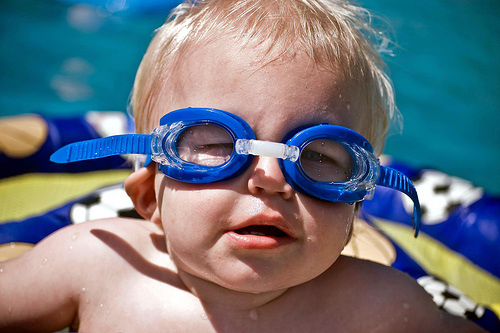

In [6]:
Image.open(Path(PATH, 'train_images', '2549968784_39bfbe44f9.jpg')).convert('RGB')

Кол-во изображений в папке совпадает с кол-вом уникальных изображений в датасете. Описание в точности соответствует фотографии, указанной в `query_id`.

Посмотрим тестовую выборкуи аналогично проверим кол-во изображений в папке с тестовыми изображениями.

In [7]:
data_info(test_df, 'test')

== test ==


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


Кол-во пропущенных значений:
 query_id      0
query_text    0
image         0
dtype: int64
Кол-во явных дубликатов: 0
Размер выборки: (500, 3)
Кол-во уникальных фото: 100


In [8]:
test_files  = list_jpg(PATH / 'test_images')

print(f'Файлов в test_images : {len(set(test_files))}')

Файлов в test_images : 100


Тестовый датасет устроен аналогичным образом. Пропусков и явных дубликатов нет. Кол-во изображений в папке соответствует кол-ву уникальных изображений в датасете.

In [9]:
data_info(crowd_df, 'crowd')
data_info(expert_df, 'expert')

== crowd ==


,image,query_id,crowd_share,crowd_yes,crowd_no
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


Кол-во пропущенных значений:
 image          0
query_id       0
crowd_share    0
crowd_yes      0
crowd_no       0
dtype: int64
Кол-во явных дубликатов: 0
Размер выборки: (47830, 5)
Кол-во уникальных фото: 1000
== expert ==


,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Кол-во пропущенных значений:
 image       0
query_id    0
exp1        0
exp2        0
exp3        0
dtype: int64
Кол-во явных дубликатов: 0
Размер выборки: (5822, 5)
Кол-во уникальных фото: 1000


In [10]:
print('Максимальное количество учатсников опроса по изображению:', max(crowd_df['crowd_yes'] + crowd_df['crowd_no']))

Максимальное количество учатсников опроса по изображению: 6


Размер выборки в крауд-оценках значительно выше, чем экспертных оценок. Кол-во строк в файле с экспертными оценками соответствует размеру обучающей выборки. Т.к. кол-во уникальных фото для обоих файлов с оценками одинаково, можно сделать вывод, что в крауд-оценках было оценено большее количество описаний к тем же фото. Максимум одно изображение в крауд-оценках оценили на соответствие 6 человек.

Посмотрим на несколько изображений из обучающей выборки. Для удобства выведем к каждому фото описание (возьмем одно из выборки) и имеющиеся оценки. Создадим sample подвыборку из 12 изображений с одним (первым) описанием и оценками соответствия описания изображению.

In [11]:
first_text_per_image = (train_df.sort_values('query_text')
                       .groupby('image', as_index=False)
                       .first())

sample = first_text_per_image.sample(12, random_state=RANDOM_STATE).reset_index(drop=True)
sample = (sample
          .merge(crowd_df[['image', 'query_id', 'crowd_yes', 'crowd_no']],
                     how='left', on=['image', 'query_id'])
          .merge(expert_df, how='left', on=['image', 'query_id'])
)

sample.head()

,image,query_id,query_text,crowd_yes,crowd_no,exp1,exp2,exp3
0,3113322995_13781860f2.jpg,354642192_3b7666a2dd.jpg#2,A person swimming in water nearby rocks and a ...,NaN,NaN,1,1,1
1,3484832904_08619300d9.jpg,3514179514_cbc3371b92.jpg#2,A baseman tries to catch a ball while a runner...,NaN,NaN,2,2,2
2,3494394662_3edfd4a34c.jpg,2933637854_984614e18b.jpg#2,"A man in an orange jersey with the letter "" 12...",NaN,NaN,1,1,2
3,3350786891_6d39b234e9.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,3.0,0.0,2,2,3
4,2891617125_f939f604c7.jpg,1679617928_a73c1769be.jpg#2,"A dog , lying down , tethered to the side mirr...",NaN,NaN,1,1,1


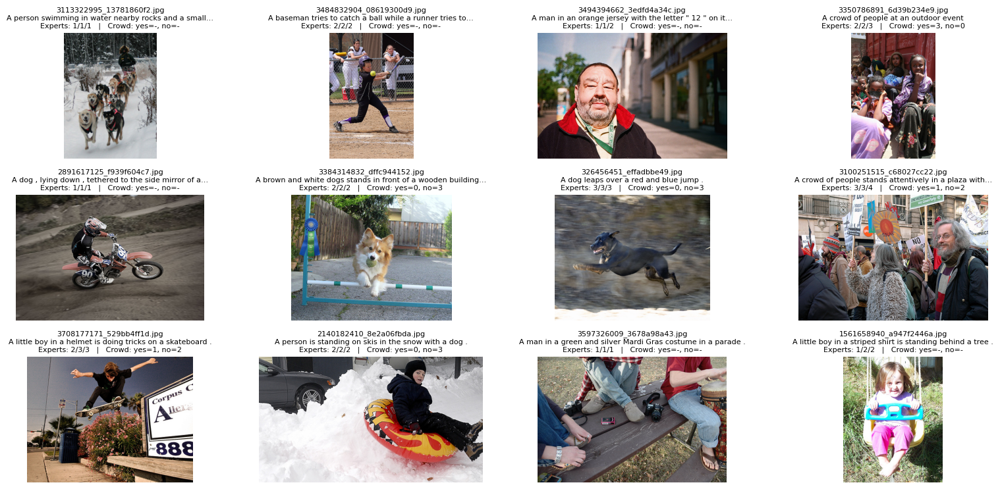

In [12]:
plt.figure(figsize=(16, 10))
for i, row in sample.iterrows():
    img_path = (Path(PATH, 'train_images', row['image']))
    img = Image.open(img_path)

    ax = plt.subplot(4, 4, i+1)
    ax.imshow(img)
    ax.axis('off')

    # обрежем длину описания для корректнго отображения
    caption = textwrap.shorten(str(row['query_text']), width=60, placeholder='…')

    def fmt_int(x):
        return '-' if pd.isna(x) else int(x)

    exp1 = fmt_int(row.get('exp1'))
    exp2 = fmt_int(row.get('exp2'))
    exp3 = fmt_int(row.get('exp3'))

    y_mark  = fmt_int(row.get('crowd_yes'))
    n_mark  = fmt_int(row.get('crowd_no'))

    ax.set_title(
        f'{row['image']}\n{caption}\n'
        f'Experts: {exp1}/{exp2}/{exp3}   |   Crowd: yes={y_mark}, no={n_mark}',
        fontsize=8
    )

plt.tight_layout()
plt.show()

По подвыборке видно, что качество экспертной разметки выше. Эксперты хорошо отлавливают явные несоответствия (ставят 1) и уверенные совпадения (3–4), при этом частичные попадания помечают как «2» (реже «3»), если в описании совпадает хотя бы пара слов. На такой разметке модель с большей вероятностью сможет научиться отличать конкретные элементы на изображениях (люди, животные и тп), даже если описание не идеально описывает изображение.

Заметны расхождения с крауд-оценками. Например, изображения с собаками эксперты оценили на 2 и 3, т.к. на изображениях действительно изображены собаки, хотя они и не выполняют действия из описания. При этом крауд-оценки соответствуют строгому несовпадению (0/3 - «за/против»). При этом часть изображений вообще не имеют крауд-оценок. Очевидно, что такие оценки менее информативны. В связи с этим на этой выборке **разумно принять экспертный сигнал как основной** источник истины.

Важно учесть, что в крауд-оценках максимум шесть голосов, и при малом числе ответов результат легко «переворачивается» одним голосом, поэтому крауд-сигнал стоит взвешивать по числу голосов и использовать как вспомогательный.

Для начала предварительно обработаем оценки экспертов и приводем их к единому, устойчивому сигналу в [0,1], который можно интерпретировать как вероятность соответствия.

1. Рассчитаем мажоритарную оценку `expert_majority` -  «коллективное решение» экспертов, если двое из трёх согласны, то берем эту оценку.
2. Отдельно выведем `expert_mean` - эту оценку используем там, где не удалось определить мажоритарную.
3. Нормируем полученное значение в шкалу `expert_prob` в диапазоне [0,1], которая станет основой для целевой переменной, с помощью формулы: (полученная оценка - 1) / 3. Тогда получим следующее соответствие:
- `1` = 0.00 (полное несоответствие)
- `2` = 0.33 (частичное/скорее нет)
- `3` = 0.67 (в целом да, но с неточностями)
- `4` = 1.00 (полное соответствие)

In [13]:
def majority_or_nan(a,b,c: int):
    '''
    Функция агрегирует три экспертные оценки в одну по принципу большинства.

    Логика
    ---------
    Функция ожидает три значения:
    - если хотя бы два эксперта выбрали одно и то же значение из [1-4], то берется эта оценка.
    - если явного большинства нет, то оставляем значение пустым.

    Параметры
    ---------
    a, b, c : int
        Оценки экспертов.
    '''
    votes = [a,b,c]
    for v in (1,2,3,4):
        if votes.count(v) >= 2:
            return float(v)
    return np.nan

expert_df['expert_majority'] = expert_df[['exp1','exp2','exp3']].apply(lambda x: majority_or_nan(*x), axis=1)
expert_df['expert_mean'] = expert_df[['exp1','exp2','exp3']].mean(axis=1)

expert_df['expert_score_rule'] = np.where(
    expert_df['expert_majority'].notna(),
    expert_df['expert_majority'],
    expert_df['expert_mean']
)

expert_df['expert_prob_rule'] = (expert_df['expert_score_rule'] - 1) / 3

expert_df.head()

,image,query_id,exp1,exp2,exp3,expert_majority,expert_mean,expert_score_rule,expert_prob_rule
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0,1.000000,1.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0,1.333333,1.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0,1.333333,1.0,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0,1.666667,2.0,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0,1.333333,1.0,0.000000


Перейдем к обработке значений краудфандинговых оценок. У нас в данных есть доля проголосовавших «за» соответствие описания и картинки (поле `crowd_share`) - используем ее как основную. Учтем количество проголосовавших: чем больше значение рассчитанной переменной `crowd_n` =  `crowd_yes` + `crowd_no`, тем выше наша уверенность в корректности оценки. Таким образом, если проголосовало мало людей — мнение крауда учитываем слабо (или вовсе игнорируем), если много — сильнее.

Веса рассчитаем следующим образом:
- если кол-во проголосовавших < 2 — крауд-оценку не учитываем (вес = 0).
- по мере роста кол-ва проголосовавших (до 6) растет и вес до максимальной доли 0,4. Таким образом мы в любом случае оставим приоритет экспертной оценки (минимум - 0.6).

In [19]:
crowd_df['crowd_n'] = crowd_df['crowd_yes'] + crowd_df['crowd_no']

def crowd_weight(n: int):
    '''
    Функция рассчитывает вес крауд-оценки в зависимости от количества голосов.

    Параметры
    ---------
    n : int
        Количество проголосовавших.
    '''
    if pd.isna(n) or n < 2:
        return 0.0
    w = (n - 2) / max(1, (6 - 2))
    return float(np.clip(w * (0.4), 0.0, 0.4))

crowd_df['w_crowd']  = crowd_df['crowd_n'].apply(crowd_weight)

crowd_df.head()


,image,query_id,crowd_share,crowd_yes,crowd_no,crowd_n,w_crowd
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0,3,0.1
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3,3,0.1
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3,3,0.1
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3,3,0.1
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3,3,0.1


Присоединим файлы с подготовленными оценками к обучающей выборке.

In [15]:
print('Размер выборки до объединения:', train_df.shape)
df_full = (train_df[['image','query_id','query_text']]
        .merge(expert_df[['image','query_id', 'expert_prob_rule']], on=['image','query_id'], how='left')
        .merge(crowd_df[['image','query_id','crowd_share', 'w_crowd']], on=['image','query_id'], how='left')
        )
print('Размер выборки после объединения:', df_full.shape)
df_full.head(2)


Размер выборки до объединения: (5822, 3)
Размер выборки после объединения: (5822, 6)


,image,query_id,query_text,expert_prob_rule,crowd_share,w_crowd
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,0.1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,NaN,NaN


При визуальной оценке семпл-подвыборки мы уже обнаружили, что часть пар изображение-описание не имеет крауд-оценок. Посмотрим на количество пропусков в оценках после объединения с обучающей выборкой.

In [16]:
print('Кол-во пропусков в крауд-оценках:', df_full['crowd_share'].isna().sum())
print('Кол-во пропусков в экспертных оценках:', df_full['expert_prob_rule'].isna().sum())

Кол-во пропусков в крауд-оценках: 3493
Кол-во пропусков в экспертных оценках: 0


Т.к. мы принимаем за основную оценку - экспертную и пропусков в них нет, то крауд-оценку как менее значимую в пропущенных парах примем за ноль.

In [17]:
df_full['crowd_share'] = df_full['crowd_share'].fillna(0)
df_full['w_crowd'] = df_full['w_crowd'].fillna(0)
df_full['crowd_share'].isna().sum()

np.int64(0)

Рассчитаем финальную оценку - целевую переменную по формуле: \
{вес экспертной оценки * экспертная оценка в диапазоне [0, 1] + вес крауд-оценки * доля проголосовавших «за»}

Размер выборки: (5822, 7)
count    5822.000000
mean        0.199782
std         0.277385
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: target, dtype: float64


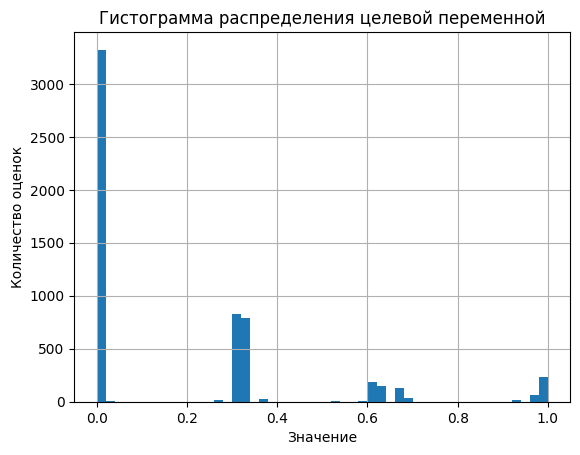

In [18]:
df_full['target'] = ((1.0 - df_full['w_crowd'])*df_full['expert_prob_rule']) + df_full['w_crowd']*df_full['crowd_share']

print('Размер выборки:', df_full.shape)
print(df_full['target'].describe())

df_full['target'].hist(bins=50)
plt.title(f'Гистограмма распределения целевой переменной')
plt.xlabel('Значение')
plt.ylabel('Количество оценок')
plt.show();

По распределению целевой переменной видно, что в датасете преобладают описания не соответствующие изображению полностью. На гистограмме видны локальные пики около 0.33, 0.67 и 1 - это следствие преобразования экспертных оценок в веротяностную шкалу. Разброс от этих значений вызван влиянием крауд-оценок. В данном случае бейзлайн 'предсказывать ноль' уже даст неплохой результат, поэтому модели необходимо 'научиться' выделять редкие выскоие значения.

<b>Вывод по разделу "Исследовательский анализ данных"</b>

1. В данных нет пропусков и явных дубликатов.  

2. Экспертная разметка более информативная, поэтому ее приняли за основную, а крауд-оценки - вспомогательные.

- Агрегация экспертных оценок выполнена по правилу «мажоритарное голосование, иначе среднее». Полученную единую оценку перевели в шкалу [0, 1] как вероятность соответствия.
- Для крауда использовали долю «за соответствие» (`crowd_share`) и взвесили её по числу голосов. Пустые крауд-оценки заполнили нулём — это согласуется с выбранной стратегией преимущества экспертной оценки.

3. В данных преобладают неверные описания для изображений (значительное преобладание нуля в целевой переменной).

## 2. Проверка данных

В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер: 'This image is unavailable in your country in compliance with local laws'

Однако, в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, необходимо удалить из обучающей выборки.

Подготовим список стоп-слов, которые могут определять детские изображения - `BAD_TERMS`. Чтобы не "удорожать" расчеты и избежать дополнительной лемматизации текста включим в перечень множественное и единственное число существительных, чтобы учитывались оба варианта.  Подготовим функцию, которая определяет наличие стоп-слов в тексте описания.

Определяет, относится ли текст к детскому контенту по набору стоп-слов.

    Логика:
    - Текст приводится к нижнему регистру.
    - С помощью регулярного выражения извлекаются токены из латинских букв
      (слова и простые словосочетания с дефисом: `baby`, `kids`, `playground`, `t-shirt`).
    - Строится множество уникальных токенов и ищется пересечение с множеством стоп-слов `terms`.
    - Если найдено хотя бы одно совпадение, функция возвращает:
      (True, "stop-word:..."), где в комментарии перечислены найденные триггеры.
      Если нет совпадений — (False, "").

    Parameters
    ----------
    text : str
        Описание изображения (caption / текстовый запрос).
    terms : set of str, optional
        Множество стоп-слов, по которым определяется детский контент.
        По умолчанию используется глобальный набор BAD_TERMS.

    Returns
    -------
    is_child : bool
        Флаг, указывающий, содержит ли текст детские маркеры.
    reason : str
        Строка с кратким описанием срабатывания (например, "stop-word:kid/children"),
        либо пустая строка, если стоп-слова не найдены.

In [21]:
def is_child_text(text: str, terms: Set[str] = BAD_TERMS):
    '''
    Функция определяет, относится ли текст к детскому контенту по набору стоп-слов.

    Параметры
    ---------
    text : str
        Описание изображения.
    terms : set of str
        Множество стоп-слов, по которым определяется детский контент.
    '''
    s = str(text).lower()
    tokens = re.findall(r"[a-z]+(?:-[a-z]+)?", s)
    bag = set(tokens)
    bad_hit = terms.intersection(bag)
    if bad_hit:
        return True, 'stop-word:' + '/'.join(sorted(bad_hit))
    return False, ''

Определим описания, которые содержат стоп-слова.

In [22]:
df_full[['to_block', 'block_reason']] = df_full['query_text'].apply(lambda t: pd.Series(is_child_text(t)))

print('Кол-во плохих описаний:', int(df_full['to_block'].sum()), 'из', len(df_full))
display(df_full.loc[df_full['to_block']==1, ['image','query_id','query_text','block_reason']].head())

Кол-во плохих описаний: 1560 из 5822


,image,query_id,query_text,block_reason
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,stop-word:child
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,stop-word:child
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,stop-word:child
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,stop-word:child
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,stop-word:child


In [23]:
df_full['block_reason'].value_counts().head(10)

block_reason
                       4262
stop-word:boy           411
stop-word:girl          357
stop-word:child         195
stop-word:girls         138
stop-word:children      106
stop-word:boys           71
stop-word:baby           46
stop-word:kids           42
stop-word:boy/child      40
Name: count, dtype: int64

Всего 1560 описаний содержат стоп-слова. При этом чаще всего это 'boy' и 'girl'.

Важно, что по ТЗ нам необходимо удалить из датасета не описания, а изображения не соответствующие правилам. Как мы ранее установили при анализе, исходное изображение, которому соответствует описание 'зашифровано' в поле `query_id`. Для уверенности сперва отберем описания, в которых есть стоп-слова и финальная оценка соответствия описания выше 0.33.  Затем удалим исходные изображения для описания, указанные в поле `query_id`.

In [24]:
bad_pairs = df_full[(df_full['to_block'] == 1) & (df_full['target'] >= 0.33)]
bad_images = bad_pairs['query_id'].str.split('#').str[0].unique()

train_clean = df_full[~df_full['image'].isin(bad_images)].reset_index(drop=True)

print(f'Кол-во отобранных описаний по правилу (детский текст + целевая переменная выше 0.33): {len(bad_pairs)}')
print(f'Кол-во изоюражений для удаления: {len(set(bad_images))}')
print('Размер до:', df_full.shape, 'после:', train_clean.shape)

Кол-во отобранных описаний по правилу (детский текст + целевая переменная выше 0.33): 364
Кол-во изоюражений для удаления: 187
Размер до: (5822, 9) после: (4695, 9)


Проверим визуально удаленные изображения.

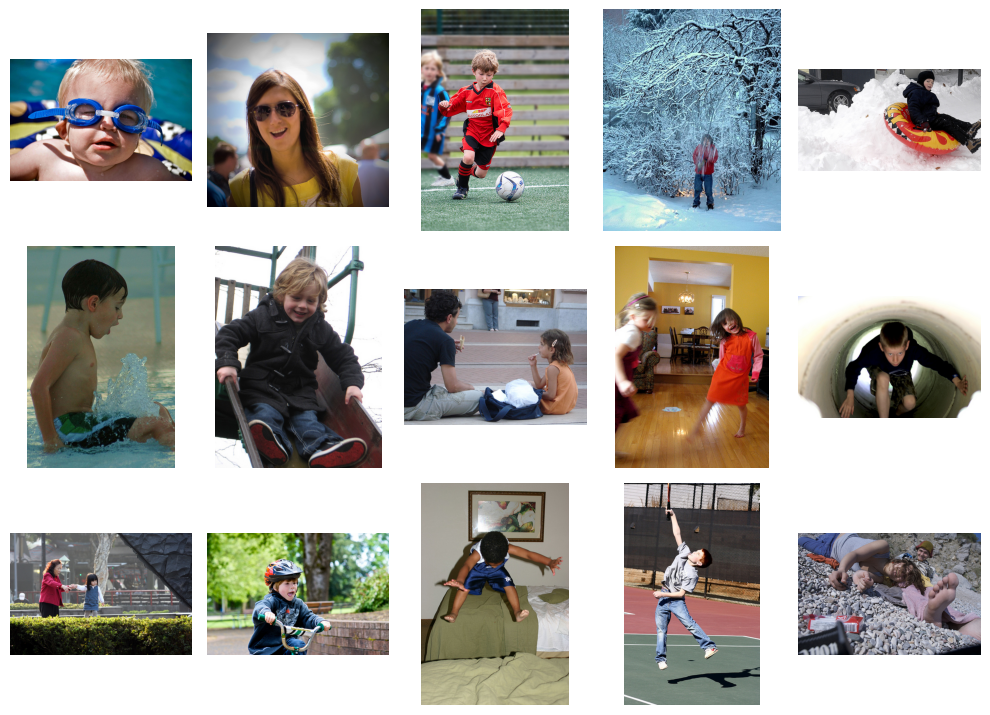

In [25]:
names = list(bad_images)[:15]
plt.figure(figsize=(10, 12))

for i, img_name in enumerate(names, start=1):
    ax = plt.subplot(5, 5, i)
    img_path = (Path(PATH, 'train_images', img_name))
    img = Image.open(img_path).convert('RGB')
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show();

На удаленных фото действительно изображены дети. Предполагаем, что корректно исключили фото из обучающей выборки.

<b>Вывод по разделу "Проверка данных"</b>

Для удаления изображений нарушающих закон некоторых стран было сделано следующее:

1. Составлен список стоп-слов **BAD_TERMS** (в единственном и множественном числе), чтобы без лемматизации уверенно ловить упоминания детей.
2. Написана функция-детектор по описанию, которая помечает тексты, содержащие стоп-слова. Найдено **1560** таких описаний; самые частые — *boy* и *girl*.
3. По требованиям ТЗ удаляем **не тексты, а изображения**. Поэтому:
  - берём только случаи, где наш итоговый скор соответствия **> 0.33** (чтобы описание действительно соотносилось с фото);
  - из `query_id` извлекаем «родное» имя фото и **исключаем все пары** с этими изображениями из train.

Визуальная проверка выборки удалённых снимков подтвердила: на них действительно изображены дети. Датасет очищен корректно для дальнейшего обучения.


## 3. Векторизация изображений

Перейдём к векторизации изображений.

Для этого используем свёрточные сети: они позволяют "выделить" главные компоненты изображений. Выберем модель ResNet50, посмотрим на слои и исключим полносвязные слои, которые отвечают за конечное предсказание.

Загрузиим модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [26]:
resnet = models.resnet50(pretrained=True)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Нам не потребуется обучать модель, поэтому заморозим веса.

In [27]:
for param in resnet.parameters():
    param.requires_grad_(False)

Определимся, все ли слои можно использовать для получения эмбеддингов. На практике используются только свёрточные слои. Для получения списка слоёв используем метод children(). В нашем случае, нужно взять все слои, кроме последних двух и перевести модель в режим предсказания.

In [28]:
backbone = nn.Sequential(
    *list(resnet.children())[:-2],
    nn.AdaptiveAvgPool2d((1, 1)),
    nn.Flatten()
)
backbone.to(device).eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


Теперь перейдём к получению предсказания. Для этого сначала изображение нужно привести в нужный формат. Для этого изменим размер картинки, вырежем центр и нормализуем.

In [29]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


Получим эмбеддинги для всех изображений. Подготовим функцию, которая по порядку читает изображения из папки, прогоняет через подготовленный на предыдущем шаге preprocess, подаёт в модель (ResNet50) и для каждого файла получает эмбеддинг размерности 2048. Для экономии памяти и ускорения вычислений используем декоратор @torch.no_grad(), который отключает вычисление градиентов.

In [31]:
@torch.no_grad()
def embed_images_iter(root: Path, names: List[str], preprocess, model, device):
    '''
    Функция читает каждое изображение, преобразовывает его и передает в модель.
    Возвращает список имён (kept) и матрицу эмбеддингов (N, 512).
    '''
    model.eval()
    vecs, kept = [], []
    for name in tqdm(names, total=len(names), desc='Embedding images'):
        p = Path(root) / name
        img = Image.open(p).convert('RGB')
        x = preprocess(img).unsqueeze(0).to(device)
        z = model(x)
        vecs.append(z.squeeze(0).cpu().numpy())
        kept.append(name)
    return kept, np.stack(vecs, axis=0)

Получим эмбеддинги для всех изображений из обучающей и тестовой выборки.

In [32]:
train_root = PATH / 'train_images'
train_names = sorted([p.name for p in (train_root).glob("*.jpg")])

test_root = PATH / 'test_images'
test_names = sorted([p.name for p in (test_root).glob("*.jpg")])

train_names, train_vecs = embed_images_iter(train_root, train_names, preprocess, backbone, device)
test_names, test_vecs = embed_images_iter(test_root, test_names, preprocess, backbone, device)

emb_train_img = pd.DataFrame(train_vecs, index=train_names).reset_index().rename(columns={"index":"image"})
emb_test_img  = pd.DataFrame(test_vecs,  index=test_names ).reset_index().rename(columns={"index":"image"})

print(emb_train_img.shape, emb_test_img.shape)
display(emb_train_img.head(2))

Embedding images:   0%|          | 0/1000 [00:00<?, ?it/s]

Embedding images:   0%|          | 0/100 [00:00<?, ?it/s]

(1000, 2049) (100, 2049)


,image,0,1,2,3,4,5,6,7,8,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,1056338697_4f7d7ce270.jpg,0.023043,0.920846,0.038650,0.858257,0.406688,0.185093,0.730176,1.568476,0.034432,...,0.037381,0.703045,0.556710,0.375198,1.122931,0.276150,1.187244,0.136031,0.175029,0.255704
1,106490881_5a2dd9b7bd.jpg,0.129605,1.534298,0.196853,0.337933,0.455051,0.407932,0.685414,0.187035,0.015801,...,0.412576,0.557559,0.181718,0.368452,0.518287,0.351678,0.119822,0.069173,0.540192,0.421513


<b>Вывод по разделу "Векторизация изображений"</b>

Для векторизации изображений была использована предобученная сверточная сеть ResNet50. Модель была модифицирована путем удаления классификационных слоев и добавления операций пулинга и выравнивания для получения эмбеддингов размерностью 2048. Для всех изображений обучающей и тестовой выборок были получены эмбеддинги с помощью функции обработки, отключающей вычисление градиентов для ускорения работы и экономии памяти.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Векторизацию выполним с помощью компактной модели `all-MiniLM-L6-v2`, загруженную через trandformers. Эта модель имеет меньший размер (384-мерные вектора), чем `bert-base-uncased` и  преднзначена специально для кодирования предложений и коротких абзацев. На основе входного текста она выводит вектор, содержащий семантическую информацию.

Инициализируем токенизатор и модель.

In [33]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
mini_lm = AutoModel.from_pretrained(MODEL_NAME).to(device).eval()

Подготовим функцию, которая преобразует тексты в эмбеддинги с помощью модели. Обработку делаем батчами: внутри каждого батча тексты токенизируются (с паддингом и обрезкой), подаются в модель, после чего мы считаем усреднённый эмбеддинг по информативным токенам (без спец-токенов [CLS] - начало последовательности и [SEP] - токен-разделитель сегментов) и нормализуем результат.

Ключевые этапы:
- **Токенизация**: каждый текст превращается в последовательность токенов. В батче все последовательности приводятся к одной длине — короткие дополняются паддингом, длинные обрезаются до `max_length`.
- **Маска внимания**: вместе с токенами формируется бинарная маска, которая помечает настоящие токены и паддинг. Дополнительно мы обнуляем позиции спец-токенов [CLS] и [SEP], чтобы они не участвовали в усреднении.
- **Получение эмбеддингов**: прогоняем батч через модель и берём скрытые представления токенов из последнего слоя.
- **Mean pooling по информативным токенам**: считаем средний вектор только по реальным токенам (без паддинга и спец-токенов).

In [34]:
@torch.no_grad()
def embed_texts(texts: List[str], batch_size: int, model=mini_lm):
    '''
    Функция строит эмбеддинги для текста с помощью трансформера.
    Возвращает матрицу эмбеддингов (N, 384).
    '''
    vecs = []

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]

        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        ).to(device)

        input_ids = inputs['input_ids']               
        attention_mask = inputs['attention_mask']   

        out = model(**inputs)
        token_embeddings = out.last_hidden_state 

        token_mask = attention_mask.clone()

        cls_id = tokenizer.cls_token_id
        sep_id = tokenizer.sep_token_id

        # выкидываем [CLS]
        if cls_id is not None:
            token_mask = token_mask * (input_ids != cls_id)

        # выкидываем [SEP]
        if sep_id is not None:
            token_mask = token_mask * (input_ids != sep_id)

        mask = token_mask.unsqueeze(-1)          
        denom = mask.sum(1).clamp(min=1)             
        emb = (token_embeddings * mask).sum(1) / denom  

        vecs.append(emb.detach().cpu().numpy().astype('float32'))

    return np.vstack(vecs) if vecs else np.zeros((0, model.config.hidden_size), dtype='float32')


In [35]:
text_train = train_clean[['image','query_id','query_text']].copy()
text_test  = test_df.copy()

print(text_train.shape, text_test.shape)

(4695, 3) (500, 3)


In [36]:
train_vecs = embed_texts(text_train['query_text'].tolist(), batch_size=256)
print('train_vecs:', train_vecs.shape)

emb_text_train = pd.DataFrame(train_vecs, columns=[f'text_{i}' for i in range(train_vecs.shape[1])])
emb_text_train.insert(0, 'query_id', text_train['query_id'].values)
emb_text_train.insert(1, 'image', text_train['image'].values)

train_vecs: (4695, 384)


<b>Вывод по разделу "Векторизация текстов"</b>

Для векторизации текстов использовалась предобученная трансформер-модель `all-MiniLM-L6-v2`. Тексты проходили токенизацию с приведением последовательностей в батче к одинаковой длине (дополнение паддингом для коротких текстов и обрезка длинных до максимальной длины). Для всех описаний из обучающей выборки были получены эмбеддинги размерностью 384 с помощью батчевой функции, которая усредняет скрытые представления информативных токенов (без паддинга и спец-токенов [CLS] и [SEP]) с использованием маски внимания.

## 5. Объединение векторов

На данном этапе нам необходимо объединить векторы изображений и векторы текстов с целевой переменной. 

У нас мультимодальные данные для которых лучше подходит L2-нормализация (метод `Normalizer`). Этот метод масштабирует каждый вектор (каждую строку целиком) к единичной длине. Он убирает влияние "магнитуды" вектора (которая часто является шумом) и оставляет только его **направление** в многомерном пространстве — а именно оно и несет основную семантическую информацию.

Однако, для этого метода обработка каждого типа эмбеддингов производится по отдельности, до их конкатенации. Такой подход гарантирует, что и визуальные, и текстовые признаки вносят в модель сопоставимый вклад, не искажая при этом структуру каждого из исходных пространств. 

Поэтому сперва нормализуем эмбеддинги по отдельности для изображений и текста, а затем объединим таблицы оставив только необходимые для обучения колонки.

In [37]:
normalizer_img = Normalizer(norm='l2')

img_feat_cols_train = [col for col in emb_train_img.columns if col != 'image']
img_feat_cols_test  = [col for col in emb_test_img.columns  if col != 'image']

emb_train_img[img_feat_cols_train] = normalizer_img.fit_transform(
    emb_train_img[img_feat_cols_train]
)
emb_test_img[img_feat_cols_test] = normalizer_img.transform(
    emb_test_img[img_feat_cols_test]
)


In [39]:
normalizer_text = Normalizer(norm='l2')

text_feat_cols_train = [col for col in emb_text_train.columns if col not in ['image', 'query_id']]

emb_text_train[text_feat_cols_train] = normalizer_text.fit_transform(
    emb_text_train[text_feat_cols_train]
)

In [40]:
emb_train_df = emb_train_img.add_prefix('img_').rename(columns={'img_image':'image'})
emb_test_df  = emb_test_img.add_prefix('img_').rename(columns={'img_image':'image'})

print('Размер до объединения:', train_clean.shape)
df_model = (train_clean[['image', 'query_id', 'target']]
              .merge(emb_train_df, on='image', how='left')
              .merge(emb_text_train, on=['image', 'query_id'], how='left'))
print('Размер после объединения:', df_model.shape)
df_model.head()

Размер до объединения: (4695, 9)
Размер после объединения: (4695, 2435)


,image,query_id,target,img_0,img_1,img_2,img_3,img_4,img_5,img_6,...,text_374,text_375,text_376,text_377,text_378,text_379,text_380,text_381,text_382,text_383
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.000840,0.033578,0.001409,0.031296,0.014829,0.006749,0.026625,...,0.083052,0.033174,0.049519,-0.085644,-0.07346,0.088841,-0.076298,0.074461,0.004502,0.075528
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.005388,0.043523,0.003736,0.006632,0.031697,0.003603,0.020187,...,0.083052,0.033174,0.049519,-0.085644,-0.07346,0.088841,-0.076298,0.074461,0.004502,0.075528
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.007355,0.082471,0.007909,0.007376,0.020737,0.019131,0.058473,...,0.083052,0.033174,0.049519,-0.085644,-0.07346,0.088841,-0.076298,0.074461,0.004502,0.075528
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.008369,0.081591,0.053581,0.002006,0.042258,0.001596,0.007960,...,0.083052,0.033174,0.049519,-0.085644,-0.07346,0.088841,-0.076298,0.074461,0.004502,0.075528
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.022287,0.059779,0.057980,0.028726,0.021910,0.012751,0.041682,...,0.083052,0.033174,0.049519,-0.085644,-0.07346,0.088841,-0.076298,0.074461,0.004502,0.075528


<b>Вывод по разделу "Объединение векторов"</b>

Векторы изображений и текстов объединены в единый датасет с целевой переменной для обучения модели.

После объединения каждая строка в `df_model` — это одна пара (image, query_id) с целевой меткой `target`.
Для каждой такой пары мы теперь храним два типа векторных представлений:

1. **Эмбеддинг изображения**

   - Получен из ResNet-50.
   - Размерность признакового вектора для картинки: 2048 чисел.
   - В датафрейме это колонки `img_...`.

2. **Эмбеддинг текста**

   - Получен из MiniLM-L6-v2.
   - Размерность признакового вектора для текста: 384 числа.
   - В датафрейме это колонки из `text_...`.

Векторные представления предварительно нормализованы по-отдельности для текстов и изображений с помощью метода Normalizer.


## 6. Обучение модели предсказания соответствия

Для обучения необходимо разделить датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в валидационную выборки. Для того чтобы учесть изображения при разбиении воспользуемся классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Используем код ниже, который разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в валидационном, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

In [41]:
X = df_model.drop(columns=['target', 'image', 'query_id'])
y = df_model['target']

gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, val_indices = next(gss.split(X=X, y=y, groups=df_model['image']))
X_train, X_val = X.loc[train_indices], X.loc[val_indices]
y_train, y_val = y[train_indices], y[val_indices]
print(X_train.shape, X_val.shape)
print(y_train.shape, y_val.shape)

(3272, 2432) (1423, 2432)
(3272,) (1423,)


R² малопригоден для нашей задачи предсказания вероятностей, так как оценивает дисперсию, а не точность вероятностных прогнозов. MAPE слишком чувствителен к малым значениям и дает нестабильные оценки. MAE и RMSE адекватно измеряют среднюю ошибку, но остановимся на MSE, т.к. эта метрика:
- Адекватно отражает серьезность ошибок предсказания вероятности
- Является дифференцируемой и стандартной функцией потерь
- Устойчива к малым значениям целевой переменной в отличие от MAPE

В качестве основной метрики используем **MSE**.

Т.к. это новая задача, нам необходимо понимать от какой величины метрики отталкиваться.
В качестве бейзлайна используем стандартный DummyRegressor. Для сравнения обучим модели:
- LinearRegression
- Ridge
- GradientBoostingRegressor
- RandomForestRegressor

Для тех моделей где это возможно подберем гиперпараметры.

In [42]:
model_spaces = {
    'Dummy(mean)': {
        'model': DummyRegressor(strategy='mean'),
        'param_grid': {}
    },

    'Linear': {
        'model': LinearRegression(),
        'param_grid': {}
    },

    'Ridge': {
        'model': Ridge(random_state=RANDOM_STATE),
        'param_grid': {
            'alpha': [0.1, 1.0, 3.0, 10.0, 30.0],
        }
    },

    'GBR': {
        'model': GradientBoostingRegressor(random_state=RANDOM_STATE),
        'param_grid': {
            'n_estimators': [200, 400],
            'learning_rate': [0.03, 0.1],
            'max_depth': [3],
            'subsample': [0.7],
            'min_samples_leaf': [1, 3],
        }
    },

    'RF': {
        'model': RandomForestRegressor(
            random_state=RANDOM_STATE,
            n_jobs=-1
        ),
        'param_grid': {
            'n_estimators': [200, 500],
            'max_depth': [None, 10, 20],
            'min_samples_leaf': [1, 2, 5],
            'max_features': ['sqrt', 'log2', 0.5],
        }
    }
}

Чтобы сравнивать величину метрики у моделей в одинаковых условиях, включая нейросеть, откажемся от использования кросс-валидации и стандартных методов перебора параметров (например, GridSearchCV). Напишем функцию для создания словаря, который можно будет перебрать для подбора гиперпарметров с оценкой на валидационной выборке.

In [ ]:
def all_param_combinations(param_grid: Dict[str, List[Any]]):
    '''
    Функция генерирует все возможные комбинации гиперпараметров из словаря списков `param_grid`
    и выводит список словарей с каждой возможной комбинацией.
    '''
    if not param_grid:
        return [dict()]
    keys = list(param_grid.keys())
    values_product = itertools.product(*[param_grid[k] for k in keys])
    combinations = []
    for values in values_product:
        combinations.append({k: v for k, v in zip(keys, values)})
    return combinations

In [46]:
results = {}

for model_name, cfg in tqdm(model_spaces.items(), desc='Модели', leave=True):
    base_model = cfg['model']
    param_grid = cfg['param_grid']

    best_mse = None
    best_params = None
    best_fitted_model = None

    all_params = list(all_param_combinations(param_grid))
    for params in tqdm(all_params,
                       desc=f'Подбор {model_name}',
                       leave=False):

        model = clone(base_model)
        model.set_params(**params)
        model.fit(X_train, y_train)

        y_pred_val = model.predict(X_val)
        mse = mean_squared_error(y_val, y_pred_val)

        if (best_mse is None) or (mse < best_mse):
            best_mse = mse
            best_params = params
            best_fitted_model = model

    results[model_name] = {
        'best_model': best_fitted_model,
        'best_params': best_params,
        'val_mse': best_mse,
    }

for name, info in results.items():
    print(f'=== {name} ===')
    print('best_params:', info['best_params'])
    print('val_mse:', info['val_mse'])
    print()


Модели:   0%|          | 0/5 [00:00<?, ?it/s]

Подбор Dummy(mean):   0%|          | 0/1 [00:00<?, ?it/s]

Подбор Linear:   0%|          | 0/1 [00:00<?, ?it/s]

Подбор Ridge:   0%|          | 0/5 [00:00<?, ?it/s]

Подбор GBR:   0%|          | 0/8 [00:00<?, ?it/s]

Подбор RF:   0%|          | 0/54 [00:00<?, ?it/s]

=== Dummy(mean) ===
best_params: {}
val_mse: 0.07639948722524172

=== Linear ===
best_params: {}
val_mse: 0.09967998711613986

=== Ridge ===
best_params: {'alpha': 10.0}
val_mse: 0.06608184471468348

=== GBR ===
best_params: {'n_estimators': 400, 'learning_rate': 0.03, 'max_depth': 3, 'subsample': 0.7, 'min_samples_leaf': 3}
val_mse: 0.05788471182661542

=== RF ===
best_params: {'n_estimators': 500, 'max_depth': 20, 'min_samples_leaf': 2, 'max_features': 0.5}
val_mse: 0.0563559100734002



По итогам обучения классических моделей ML:
- **Лучшая модель — RandomForest c MSE = 0.0564**. Это лучше бейзлайна Dummy(mean) (0.0764) примерно на 26% и лучше градиентного бустинга (0.0579).
- Градиентный бустинг показал близкий результат — MSE = 0.0579. Он чуть хуже леса, но разрыв небольшой. Это говорит, что бустинг уже хорошо учит нелинейности и взаимодействия между признаками изображения и текста. Возможно, с более тщательным тюнингом он смог бы догнать лучшую модель.
- Линейные модели (Linear, Ridge) заметно слабее. Обычная линейная регрессия: MSE = 0.0997. Ridge: MSE = 0.066. Они обе хуже не только деревьев, но и фактически не сильно лучше простого Dummy.
- Dummy(mean) даёт MSE = 0.0764. Это наш нижний порог качества. Всё, что бьёт его значительно, — имеет смысл.

Перейдем к построению полносвязной нейронной модели. Для начала для корректной работы переведем выборки в тензоры.

In [47]:
X_train_t = torch.tensor(X_train.to_numpy(), dtype=torch.float32, device=device)
X_val_t = torch.tensor(X_val.to_numpy(), dtype=torch.float32, device=device)

y_train_t = torch.tensor(y_train.values, dtype=torch.float32, device=device)
y_val_t = torch.tensor(y_val.values, dtype=torch.float32, device=device)

Зададим архитектуру базовой модели (Baseline) через класс nn.Module. Создадим класс BaselineNet, где используем 3 слоя и нелинейные функции активации (ReLU и ее производные), чтобы лучше улавливать сложные зависимости. К тому же, именно ReLU рекомендуется к использованию для регрессионных моделей. Добавим dropout для борьбы с переобучением.

In [48]:
class BaselineNet(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3,
                 n_out_neurons, dropout_rate_1, dropout_rate_2, dropout_rate_3):
        super(BaselineNet, self).__init__()

        self.layer1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.act1   = nn.ReLU()
        self.drop1  = nn.Dropout(dropout_rate_1)

        self.layer2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.act2   = nn.LeakyReLU(0.1)
        self.drop2  = nn.Dropout(dropout_rate_2)

        self.layer3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
        self.act3   = nn.ELU()
        self.drop3  = nn.Dropout(dropout_rate_3)

        self.out    = nn.Linear(n_hidden_neurons_3, n_out_neurons)

    def forward(self, x):
        x = self.drop1(self.act1(self.layer1(x)))
        x = self.drop2(self.act2(self.layer2(x)))
        x = self.drop3(self.act3(self.layer3(x)))
        x = self.out(x)
        return x

Зададим начальные параметры сети:
- количество нейронов в убывающем порядке: входной слой равен размерности данных, далее по убыванию до одного значения на выходе (предсказания вероятности).
- параметры метода dropout. Смамое большое значение поставим на первом скрытом слое, где наибольшее количество параметров.
- размер батча и количество эпох.

In [49]:
n_in_neurons = X_train_t.shape[1]
n_hidden_neurons_1 = 64
n_hidden_neurons_2 = 32
n_hidden_neurons_3 = 16
n_out_neurons = 1

dropout_rate_1 = 0.3
dropout_rate_2 = 0.1
dropout_rate_3 = 0.1

net = BaselineNet(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3,
                  n_out_neurons, dropout_rate_1, dropout_rate_2, dropout_rate_3)

batch_size = 10
num_epochs = 1000

Создадим функцию для обучения модели. В качестве оптимизатора используем Adam. Дополнительно добавим L2-регуляризацию с помощью атрибута weight_decay. В качестве функции потерь используем nn.MSELoss() - среднеквадратичное отклонение, т.к. в качестве ключевой метрики выбрана MSE. При обучении модели метрику качества будем вычислять каждые 50 эпох.

In [50]:
def train_model(net, X_train, y_train, X_val, y_val, batch_size,
                 num_epochs, lr, weight_decay, patience=100):

    optimizer = torch.optim.Adam(net.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.MSELoss()
    num_batches = ceil(len(X_train) / batch_size)

    best_val_mse = None
    best_state = None
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        net.train()
        order = torch.randperm(len(X_train), device=device)

        for batch_idx in range(num_batches):
            start = batch_idx * batch_size
            idx = order[start:start+batch_size]

            xb = X_train[idx]
            yb = y_train[idx]

            optimizer.zero_grad()
            preds = net(xb).flatten()
            loss = criterion(preds, yb)
            loss.backward()
            optimizer.step()

        net.eval()
        with torch.no_grad():
            val_preds = net(X_val).flatten()
            val_preds_cpu = val_preds.detach().cpu().numpy()
            y_val_cpu = y_val.detach().cpu().numpy()

        val_mse = mean_squared_error(y_val_cpu, val_preds_cpu)

        if (best_val_mse is None) or (val_mse < best_val_mse):
            best_val_mse = val_mse
            best_state = {k: v.clone() for k, v in net.state_dict().items()}
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

        if epoch % 50 == 0:
            print(f'[epoch {epoch}] val MSE={val_mse:.4f}')

        if epochs_no_improve >= patience:
            break

    if best_state is not None:
        net.load_state_dict(best_state)

    return best_val_mse, net

In [51]:
baseline_val_preds, baseline_model = train_model(net, X_train_t, y_train_t, X_val_t, y_val_t, batch_size, num_epochs, lr=1e-3, weight_decay=1e-5, patience=100)

[epoch 0] val MSE=0.0669
[epoch 50] val MSE=0.0591
[epoch 100] val MSE=0.0637


Попробуем улучшить метрику с помощью подбора значения для dropout и размера батча с использованием библиотеки optuna. Архитектуру нейронной сети оставим без изменений.

In [52]:
def objective(trial: optuna.Trial):
    dropout_rate_1 = trial.suggest_float('dropout_1', 0.0, 0.5, step=0.05)
    dropout_rate_2 = trial.suggest_float('dropout_2', 0.0, 0.1, step=0.05)
    dropout_rate_3 = trial.suggest_float('dropout_3', 0.0, 0.1, step=0.05)
    batch_size = trial.suggest_int('batch_size', 8, 64, step=8)
    lr = trial.suggest_float('lr', 1e-4, 3e-3, log=True)
    weight_decay = trial.suggest_float('weight_decay', 1e-6, 1e-3, log=True)
    num_epochs = trial.suggest_int('num_epochs', 50, 400, step=50)

    net = BaselineNet(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3,
                      n_out_neurons, dropout_rate_1, dropout_rate_2, dropout_rate_3).to(device)

    val_mse, trained_net = train_model(net, X_train_t, y_train_t, X_val_t, y_val_t, batch_size, num_epochs,
                                        lr, weight_decay, patience=100)

    return val_mse

In [53]:
study = optuna.create_study(
    direction='minimize',
    sampler=TPESampler(seed=RANDOM_STATE),
    pruner=optuna.pruners.HyperbandPruner()
)
study.optimize(objective, n_trials=50, show_progress_bar=True)

print('Лучшие гиперпараметры:', study.best_params)
print('Лучшая валидационная MSE:', study.best_value)

[I 2025-11-19 14:05:58,764] A new study created in memory with name: no-name-2a2e0417-3512-48ef-a440-3a7cfbcac825


  0%|          | 0/50 [00:00<?, ?it/s]

[epoch 0] val MSE=0.0743
[I 2025-11-19 14:06:02,566] Trial 0 finished with value: 0.05645109713077545 and parameters: {'dropout_1': 0.2, 'dropout_2': 0.1, 'dropout_3': 0.1, 'batch_size': 40, 'lr': 0.0001700037298921101, 'weight_decay': 2.9375384576328313e-06, 'num_epochs': 50}. Best is trial 0 with value: 0.05645109713077545.
[epoch 0] val MSE=0.0673
[epoch 50] val MSE=0.0632
[I 2025-11-19 14:06:26,464] Trial 1 finished with value: 0.05507919564843178 and parameters: {'dropout_1': 0.45, 'dropout_2': 0.05, 'dropout_3': 0.1, 'batch_size': 8, 'lr': 0.002708160864249967, 'weight_decay': 0.0003142880890840109, 'num_epochs': 100}. Best is trial 1 with value: 0.05507919564843178.
[epoch 0] val MSE=0.0693
[epoch 50] val MSE=0.0624
[epoch 100] val MSE=0.0614
[I 2025-11-19 14:06:34,210] Trial 2 finished with value: 0.05704592168331146 and parameters: {'dropout_1': 0.1, 'dropout_2': 0.0, 'dropout_3': 0.0, 'batch_size': 40, 'lr': 0.0004345454109729475, 'weight_decay': 7.476312062252308e-06, 'num_e

In [54]:
best_params = study.best_params

final_net = BaselineNet(
    n_in_neurons=X_train_t.shape[1],
    n_hidden_neurons_1=64,
    n_hidden_neurons_2=32,
    n_hidden_neurons_3=16,
    n_out_neurons=1,
    dropout_rate_1=best_params['dropout_1'],
    dropout_rate_2=best_params['dropout_2'],
    dropout_rate_3=best_params['dropout_3']
).to(device)

final_mse, final_trained_net = train_model(
    net=final_net,
    X_train=X_train_t,
    y_train=y_train_t,
    X_val=X_val_t,
    y_val=y_val_t,
    batch_size=best_params['batch_size'],
    num_epochs=best_params['num_epochs'],
    lr=best_params['lr'],
    weight_decay=best_params['weight_decay'],
    patience=100
)

print("Финальная MSE на валидационной выборке:", final_mse)

[epoch 0] val MSE=0.0650
[epoch 50] val MSE=0.0492
[epoch 100] val MSE=0.0512
[epoch 150] val MSE=0.0509
[epoch 200] val MSE=0.0496
Финальная MSE на валидационной выборке: 0.047563180327415466


Нейросеть смогла обойти все классические модели. Финальная MSE на валидации = 0.0476, что лучше результата RandomForest (0.0564) примерно на 14%.

<b>Вывод по разделу "Обучение модели предсказания соответствия"</b>

Для корректной оценки моделей мы сначала разбили выборку на train/val так, чтобы одно и то же изображение не оказывалось в обеих частях. Для этого использовали GroupShuffleSplit с разбиением 70/30 по группам. В качестве целевой метрики выбрали MSE. Эта метрика хорошо отражает величину ошибок вероятностного прогноза, устойчива при малых значениях целевой переменной и может использоваться как функция потерь при обучении.

Мы построили базовый уровень качества с помощью DummyRegressor, затем обучили и настроили несколько моделей (LinearRegression, Ridge, GradientBoostingRegressor, RandomForestRegressor), подбирая гиперпараметры без кросс-валидации — все модели оценивались в одинаковых условиях на одной и той же валидационной выборке. В последнюю очередь обучили нейросеть. Полученные результаты представлены в таблице.

| Модель              | Лучшие гиперпараметры                                                                                               | MSE на валидации |
| ------------------- | ------------------------------------------------------------------------------------------------------------------- | ---------------- |
| Dummy (mean)        | —                                                                                                                   | 0.0764           |
| Linear Regression   | —                                                                                                                   | 0.0997           |
| Ridge Regression    | `alpha = 10.0`                                                                                                      | 0.0661          |
| Gradient Boosting   | `n_estimators = 400`, `learning_rate = 0.03`, `max_depth = 3`, `subsample = 0.7`, `min_samples_leaf = 3`            | 0.0579           |
| Random Forest       | `n_estimators = 500`, `max_depth = 20`, `min_samples_leaf = 2`, `max_features = 0.5`                              | 0.0564          |
| Нейросеть           | `dropout_1`: 0.3, `dropout_2`: 0.05, `dropout_3`: 0.05, `batch_size`:16,                           | **0.0476**       |
|                     | `lr`: 0.0005536804684537574, `weight_decay`: 0.0008757592296896418, `num_epochs`: 300                                                           |                  |


## 7. Тестирование модели

Лучшей моделью оказалась нейросеть с MSE = 0.0476.

Возьмем подготовленные на предыдцщих этапах эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение.

In [56]:
emb_test_df = emb_test_img.sort_values("image").reset_index(drop=True)
IMG_NAMES = emb_test_df["image"].values
IMG_EMB = emb_test_df.drop(columns=["image"]).to_numpy(dtype="float32")

print("IMG_EMB:", IMG_EMB.shape, "unique images:", len(IMG_NAMES))

IMG_EMB: (100, 2048) unique images: 100


Подготовим функцию, которая принимает на вход текстовое описание, делает его векторизацию и возвращает картинку с максимальным значением метрики.

In [57]:
def get_picture(text):
    flag_child, _ = is_child_text(text)
    if flag_child:
        print('\n' + '-' * 20, text, '-' * 20 + '\n')
        print('This image is unavailable in your country in compliance with local laws.\n')
        return

    text_embed = embed_texts([text], batch_size=1)
    text_embed_df = pd.DataFrame(
        text_embed,
        columns=normalizer_text.feature_names_in_
    )

    text_embed_norm = normalizer_text.transform(text_embed_df).astype('float32')

    X = np.hstack([IMG_EMB, np.repeat(text_embed_norm, IMG_EMB.shape[0], axis=0)]).astype('float32')
    

    with torch.no_grad():
        predictions = final_net(torch.from_numpy(X).to(device)).cpu().numpy().ravel()

    df = pd.DataFrame({'image': IMG_NAMES, 'pred': predictions})
    top_df = df.sort_values('pred', ascending=False).head(5)
    top = top_df['image'].tolist()
    top_score = top_df['pred'].tolist()

    print('\n' + '-' * 20, text, '-' * 20 + '\n')
    fig = plt.figure(figsize=(15, 5))
    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = 0

    for i in range(5):
        ax = fig.add_subplot(1, 6, i+1, title=round(float(top_score[i]), 2))
        image = Image.open(Path(PATH, 'test_images', top[i])).convert("RGB")
        ax.imshow(image)
        plt.xticks([]); plt.yticks([])
        plt.tight_layout()

    plt.show()
    return None


Выберем 10 случайных описаний из тестовой выборки и выведем для них отобранные моделью изображения.

In [58]:
samples = test_df.sample(10)
text_test_sample = list(samples['query_text'])
text_test_sample

['A Yorkie trying to catch a red toy .',
 'Three riders wearing black jerseys jump their BMX bikes into the air .',
 'a tan dog wearing a multicolored color running on the beach',
 'A little white dog in running on the sidewalk .',
 'Two women in head wraps .',
 'A white dog with brown ears is running on the sidewalk .',
 'A group of friends play instruments in the middle of the woods .',
 'Four people playing basketball on wooden area near the beach .',
 'A tan dog runs through the brush .',
 'Three men on mountain bikes go over a sand hill .']


-------------------- A Yorkie trying to catch a red toy . --------------------



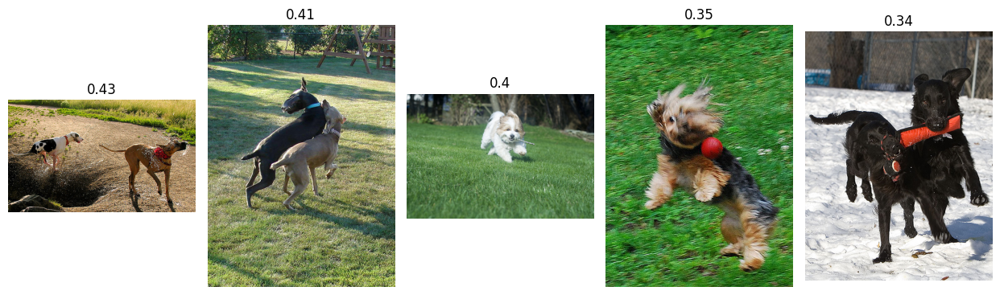


-------------------- Three riders wearing black jerseys jump their BMX bikes into the air . --------------------



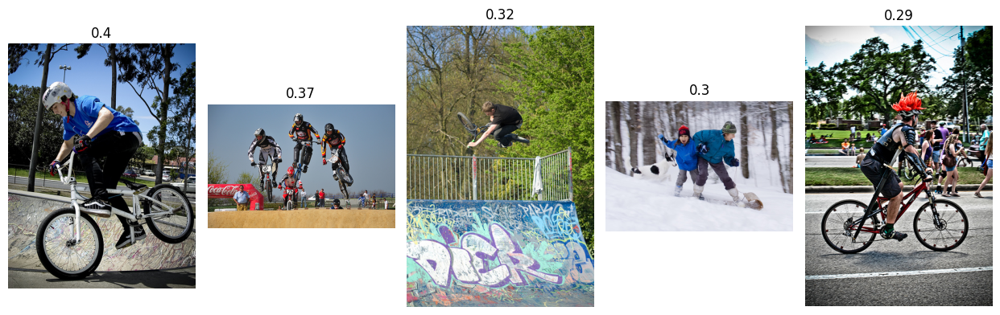


-------------------- a tan dog wearing a multicolored color running on the beach --------------------



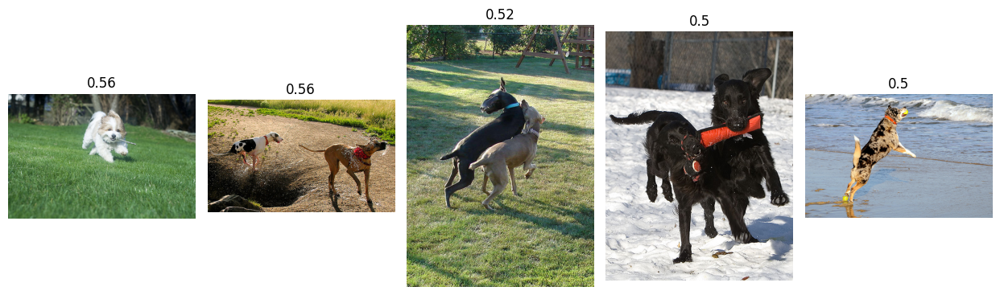


-------------------- A little white dog in running on the sidewalk . --------------------



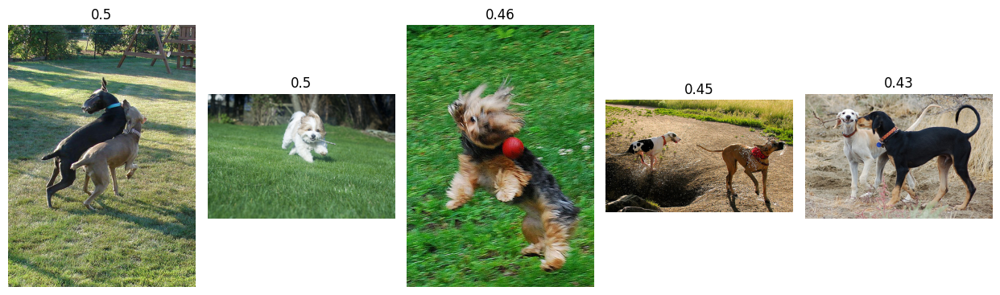


-------------------- Two women in head wraps . --------------------



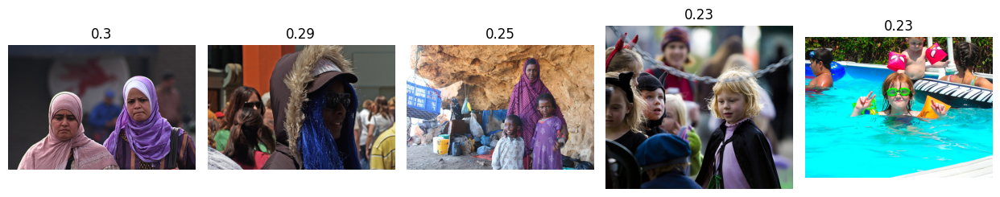


-------------------- A white dog with brown ears is running on the sidewalk . --------------------



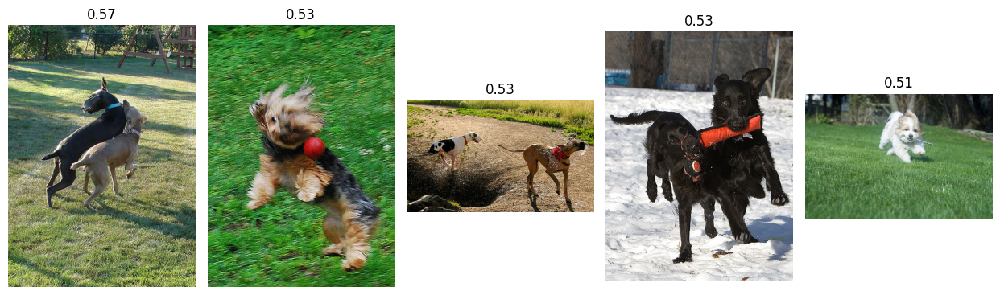


-------------------- A group of friends play instruments in the middle of the woods . --------------------



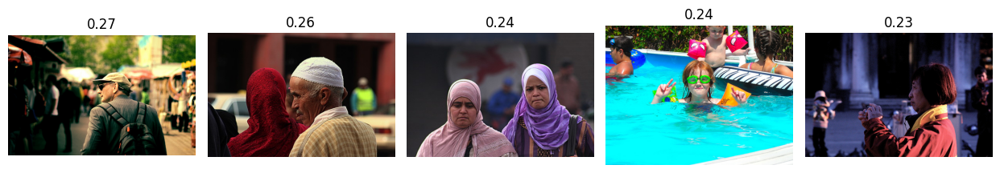


-------------------- Four people playing basketball on wooden area near the beach . --------------------



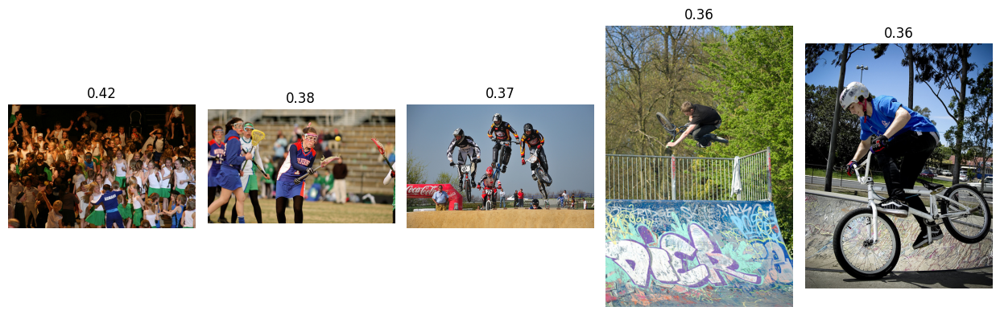


-------------------- A tan dog runs through the brush . --------------------



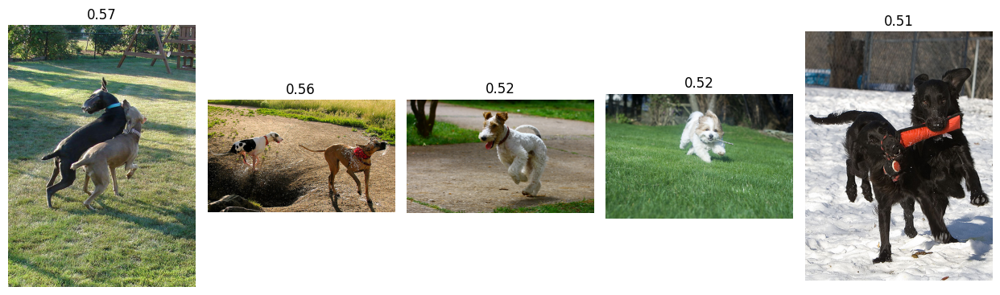


-------------------- Three men on mountain bikes go over a sand hill . --------------------



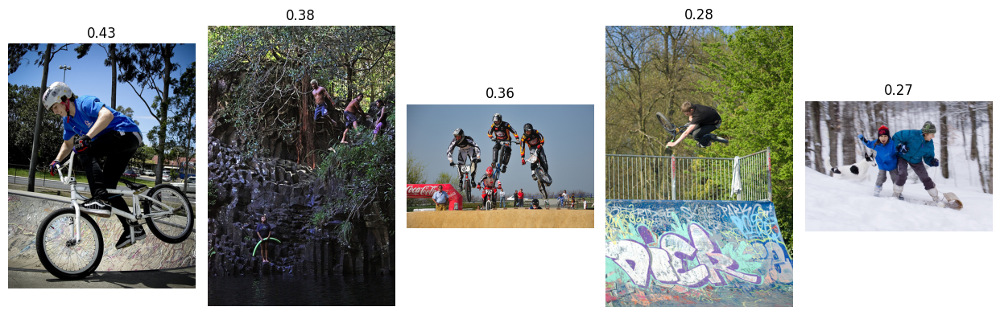

In [59]:
for text in text_test_sample:
    get_picture(text)

<b>Вывод по разделу "Тестирование модели"</b>

Отобраны 10 случайных описаний из тестовой выборки и к ним подобраны по 5 наиболее релевантных изображений (с самым высоким значением вероятности) .

В результате можно сделать вывод, что для простых описаний типа «X делает Y в окружении Z» модель даёт релевантный топ-1 и высокие вероятности. Для более сложных описаний, где важны отношения между несколькими объектами в кадре, модель уже начинает работать как «поиск по ключевым словам в эмбеддинге»: то есть выдаёт сцены с близкими темами, но не точной комбинацией условий. Отсюда много собак, но не всегда именно та, что нужна по запросу. Визуально топ-5 всё равно «узкотематический». То есть если запрос про собак — в топе собаки, если про велосипед — велосипеды и т.д. Это значит, что модель учится не случайно, а по смыслу.

## 8. Использование модели CLIP от OPEN AI

Сравним результаты работы полученной ранее модели с предобученной нейросетью CLIP (Contrastive Language-Image Pre-trained). CLIP предобучалась на огромном по размеру датасете пар изображение-текст и способна понимать не просто общую "тематику" изображения (собаки, кошки, люди и т.п.), как это делает наш классификатор, а полностью улавливать весь контекст. Доп.обучение при этом не требуется, нам необходимо только векторизовать наши данные с помощью встроенных инструментов CLIP.

Инициализируем модель через transformer.

In [60]:
clip_model = CLIPModel.from_pretrained(CLIP_NAME).to(device).eval()
clip_processor = CLIPProcessor.from_pretrained(CLIP_NAME)

Т.к. у CLIP свой встроенный метод векторизации, поэтому повторим заново весь процесс для текста и изображений. 

Начнем с изображений. Важно учесть, что CLIPProcessor возвращает словарь, а не тензор как это было с ResNet, поэтому немного модифицируем предыдущую функцию для получения веекторов изображений.

In [ ]:
@torch.no_grad()
def embed_images_iter_clip(root, names, processor, model, device='cpu'):
    '''
    Функция читает каждое изображение, прогоняет через CLIP и возвращает:
    - kept: список имён файлов (kept) и матрицу матрицу эмбеддингов (N, 512)
    '''
    model.eval()
    vecs, kept = [], []

    for name in tqdm(names, total=len(names), desc='Embedding images (CLIP)'):
        p = Path(root) / name
        img = Image.open(p).convert('RGB')

        inputs = processor(images=img, return_tensors='pt').to(device)

        z = model.get_image_features(**inputs) 

        vecs.append(z.squeeze(0).cpu().numpy())
        kept.append(name)

    return kept, np.stack(vecs, axis=0)


In [62]:
train_names_clip, train_vecs_clip = embed_images_iter_clip(train_root, train_names, clip_processor, clip_model, device)
test_names_clip, test_vecs_clip = embed_images_iter_clip(test_root, test_names, clip_processor, clip_model, device)

emb_train_img_clip = pd.DataFrame(train_vecs_clip, index=train_names_clip).reset_index().rename(columns={'index':'image'})
emb_test_img_clip  = pd.DataFrame(test_vecs_clip,  index=test_names_clip ).reset_index().rename(columns={'index':'image'})

print(emb_train_img_clip.shape, emb_test_img_clip.shape)
display(emb_train_img_clip.head(2))

Embedding images (CLIP):   0%|          | 0/1000 [00:00<?, ?it/s]

Embedding images (CLIP):   0%|          | 0/100 [00:00<?, ?it/s]

(1000, 513) (100, 513)


,image,0,1,2,3,4,5,6,7,8,...,502,503,504,505,506,507,508,509,510,511
0,1056338697_4f7d7ce270.jpg,0.529711,0.507866,-0.014296,0.005955,-0.178848,0.089191,0.579242,0.299036,0.644132,...,-0.541030,0.323624,0.146667,0.251089,0.382325,-0.342547,-0.763859,0.637885,-0.401777,-0.233480
1,106490881_5a2dd9b7bd.jpg,0.260149,0.190995,-0.258447,0.007751,0.225401,-0.174339,0.004886,-0.055314,0.244780,...,0.039981,0.510883,0.117329,-0.104438,0.324582,0.013884,-0.874795,0.641889,0.211970,0.141342


Векторизуем текст также с помощью инструментов CLIP.

In [64]:
@torch.no_grad()
def clip_embed_texts(texts, processor, model, device, batch_size):
    """
    Считает CLIP-эмбеддинги для списка текстов.
    Возвращает матрицу (N, 512)
    """
    model.eval()
    vecs = []

    for i in tqdm(range(0, len(texts), batch_size), desc='Embedding texts (CLIP)'):
        batch = texts[i:i+batch_size]

        inputs = processor(
            text=batch,
            return_tensors='pt',
            padding=True,
            truncation=True
        ).to(device)

        text_emb = model.get_text_features(**inputs)              

        vecs.append(text_emb.cpu().numpy().astype('float32'))

    return np.vstack(vecs)

In [65]:
train_vecs_clip = clip_embed_texts(text_train['query_text'].tolist(),
                                   clip_processor,
                                   clip_model,
                                   device, batch_size=256
                                   )
print('train_vecs_clip:', train_vecs_clip.shape)

emb_text_train_clip = pd.DataFrame(train_vecs_clip, columns=[f'clip_text_{i}' for i in range(train_vecs_clip.shape[1])])
emb_text_train_clip.insert(0, 'query_id', text_train['query_id'].values)
emb_text_train_clip.insert(1, 'image', text_train['image'].values)

Embedding texts (CLIP):   0%|          | 0/19 [00:00<?, ?it/s]

train_vecs_clip: (4695, 512)


Для корректного сравнения метрики повторим масштабирование (нормализацию) векторов для изображений и текста.

In [66]:
normalizer_img_clip = Normalizer(norm='l2')

img_feat_cols_train_clip = [col for col in emb_train_img_clip.columns if col != 'image']
img_feat_cols_test_clip  = [col for col in emb_test_img_clip.columns  if col != 'image']

emb_train_img_clip[img_feat_cols_train_clip] = normalizer_img_clip.fit_transform(
    emb_train_img_clip[img_feat_cols_train_clip]
)
emb_test_img_clip[img_feat_cols_test_clip] = normalizer_img_clip.transform(
    emb_test_img_clip[img_feat_cols_test_clip]
)


In [67]:
normalizer_text_clip = Normalizer(norm='l2')

text_feat_cols_train_clip = [col for col in emb_text_train_clip.columns if col not in ['image', 'query_id']]

emb_text_train_clip[text_feat_cols_train_clip] = normalizer_text_clip.fit_transform(
    emb_text_train_clip[text_feat_cols_train_clip]
)

Объединим обучающий датасет и выделим из него те же наблюдения, что были в валидационной выборке для обучения предыдущих моделей. 

In [68]:
emb_train_df_clip = emb_train_img_clip.add_prefix('clip_img_').rename(columns={'clip_img_image':'image'})
emb_test_df_clip  = emb_test_img_clip.add_prefix('clip_img_').rename(columns={'clip_img_image':'image'})

print('Размер до объединения:', train_clean.shape)
df_model_clip = (train_clean[['image', 'query_id', 'target']]
              .merge(emb_train_df_clip, on='image', how='left')
              .merge(emb_text_train_clip, on=['image', 'query_id'], how='left'))
print('Размер после объединения:', df_model_clip.shape)
df_model_clip.head()

Размер до объединения: (4695, 9)
Размер после объединения: (4695, 1027)


,image,query_id,target,clip_img_0,clip_img_1,clip_img_2,clip_img_3,clip_img_4,clip_img_5,clip_img_6,...,clip_text_502,clip_text_503,clip_text_504,clip_text_505,clip_text_506,clip_text_507,clip_text_508,clip_text_509,clip_text_510,clip_text_511
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.045367,0.043496,-0.001224,0.000510,-0.015317,0.007639,0.049609,...,-0.034126,0.072126,0.040707,-0.048389,-0.033506,-0.017856,0.026729,0.017854,0.032808,-0.039688
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,0.0,0.000832,0.062394,-0.000397,0.055692,0.030966,-0.021432,0.001914,...,-0.034126,0.072126,0.040707,-0.048389,-0.033506,-0.017856,0.026729,0.017854,0.032808,-0.039688
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,0.0,-0.000358,0.012194,-0.001064,0.023898,0.059350,0.030268,0.001926,...,-0.034126,0.072126,0.040707,-0.048389,-0.033506,-0.017856,0.026729,0.017854,0.032808,-0.039688
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,0.0,-0.019611,0.035012,0.043793,-0.007710,0.018386,0.072150,0.013157,...,-0.034126,0.072126,0.040707,-0.048389,-0.033506,-0.017856,0.026729,0.017854,0.032808,-0.039688
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,0.0,-0.035046,0.043626,0.020196,-0.024195,0.039991,0.009842,0.023717,...,-0.034126,0.072126,0.040707,-0.048389,-0.033506,-0.017856,0.026729,0.017854,0.032808,-0.039688


Рассчитаем целевую метрику для той же валидационной выборки. 

Для расчета MSE нам необходимо получить предсказания модели. В случае с CLIP для этой цели мы получаем zero-shot score, т.е. мы берем предобученную модель, никак дополнительно не настраивая ее веса, и рассчитываем косинусное сходство между векторами - это и будут наши предсказания. А затем по этим предсказаниям считаем MSE как обычно.

Для начала разделим колонки по признаку текст/изображение и получим матрицы эмбеддингов для расчетов.

In [69]:
img_cols_clip  = [c for c in df_model_clip.columns if c.startswith('clip_img_')]
text_cols_clip = [c for c in df_model_clip.columns if c.startswith('clip_text_')]

img_mat_clip  = df_model_clip[img_cols_clip].to_numpy(dtype='float32')
text_mat_clip = df_model_clip[text_cols_clip].to_numpy(dtype='float32')


Рассчитаем zero-shot score для каждой строки, а затем рассчитаем MSE на той же валидационной выборке, используя ранее сохраненные индексы (`val_indices`).

In [70]:
clip_scores = (img_mat_clip * text_mat_clip).sum(axis=1)  
df_model_clip['clip_score'] = clip_scores

clip_val = clip_scores[val_indices] 
mse_clip = mean_squared_error(y_val, clip_val)
print('MSE на валидационной выборке для модели CLIP:', mse_clip)

MSE на валидационной выборке для модели CLIP: 0.056325750672461185


По результатам сравнения видно, что **Zero-shot CLIP** без какого-либо дообучения на данных даёт **MSE ≈ 0.0563** — то есть работает примерно на уровне лучших бустинговых моделей. При этом по метрике полносвязная нейросеть дала лучший результат (**MSE = 0.0476**). 

Оценим визуально раоту модели CLIP на тестовой выборке. Для этого внесем небольшие правки исходную функцию `get_picture`, чтобы учесть особенности предобработки текста для этой модели и расчет предсказаний (скоров). Остальное оставим без изменений.

In [71]:
img_feat_cols_clip = [col for col in emb_test_img_clip.columns if col != 'image']
IMG_EMB_CLIP = emb_test_img_clip[img_feat_cols_clip].to_numpy(dtype='float32')
IMG_NAMES_CLIP = emb_test_img_clip['image'].tolist()


In [72]:
def get_picture_clip(text):
    flag_child, _ = is_child_text(text)
    if flag_child:
        print('\n' + '-' * 20, text, '-' * 20 + '\n')
        print('This image is unavailable in your country in compliance with local laws.\n')
        return

    text_vec = clip_embed_texts(
        [text],
        processor=clip_processor,
        model=clip_model,
        device=device,
        batch_size=1
    ) 

    text_vec_df = pd.DataFrame(
        text_vec,
        columns=text_feat_cols_train_clip 
    )
    text_vec_norm = normalizer_text_clip.transform(text_vec_df).astype('float32') 

    scores = IMG_EMB_CLIP @ text_vec_norm[0]

    top_idx = np.argsort(scores)[::-1][:5]
    top = [IMG_NAMES_CLIP[i] for i in top_idx]
    top_score = [scores[i] for i in top_idx]

    print('\n' + '-' * 20, text, '-' * 20 + '\n')
    fig = plt.figure(figsize=(15, 5))
    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = 0

    for i in range(5):
        ax = fig.add_subplot(1, 6, i + 1, title=round(float(top_score[i]), 3))
        image = Image.open(Path(PATH, 'test_images', top[i])).convert("RGB")
        ax.imshow(image)
        plt.xticks([]); plt.yticks([])
        plt.tight_layout()

    plt.show()
    return None


Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- A Yorkie trying to catch a red toy . --------------------



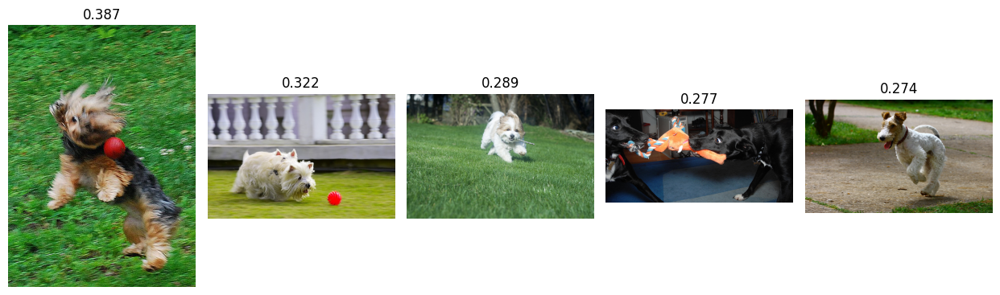

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- Three riders wearing black jerseys jump their BMX bikes into the air . --------------------



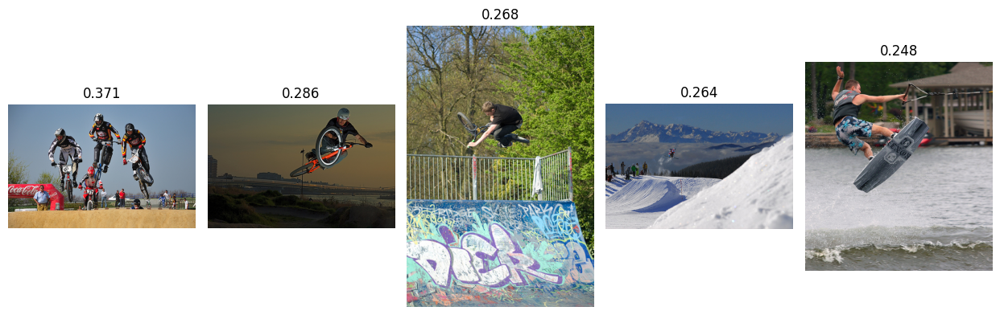

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- a tan dog wearing a multicolored color running on the beach --------------------



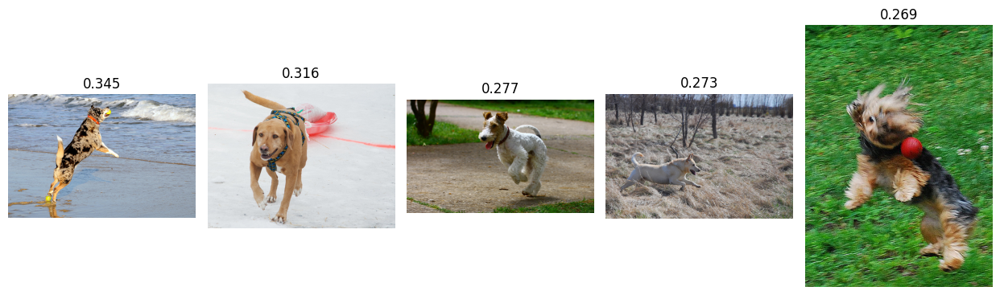

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- A little white dog in running on the sidewalk . --------------------



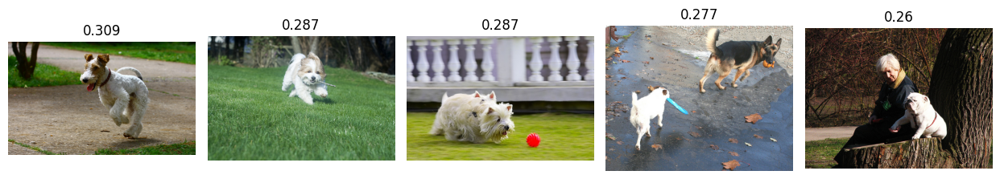

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- Two women in head wraps . --------------------



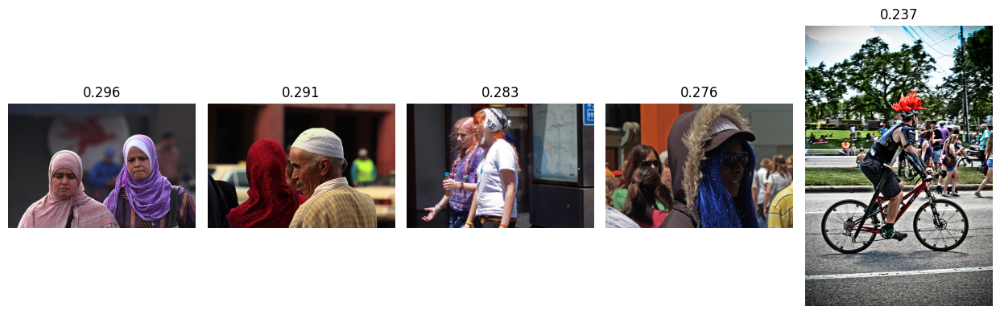

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- A white dog with brown ears is running on the sidewalk . --------------------



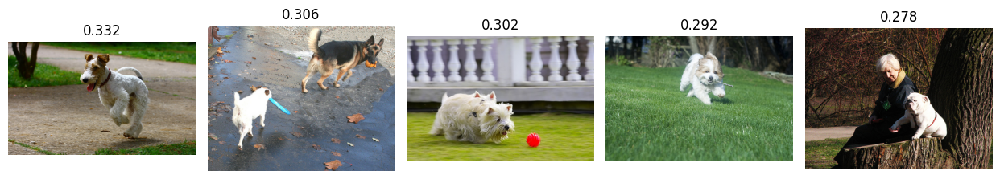

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- A group of friends play instruments in the middle of the woods . --------------------



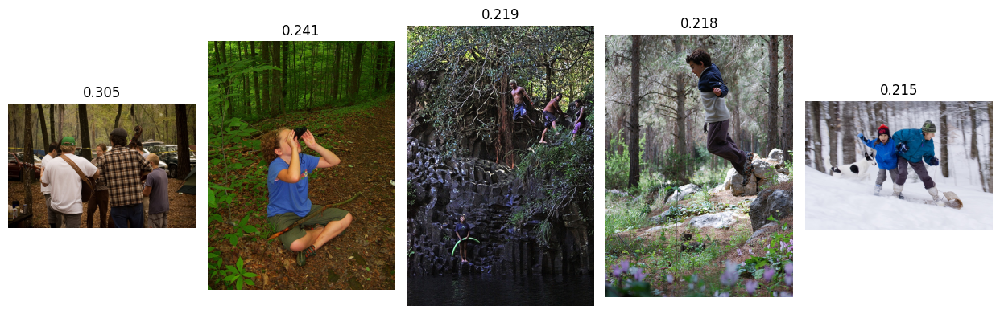

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- Four people playing basketball on wooden area near the beach . --------------------



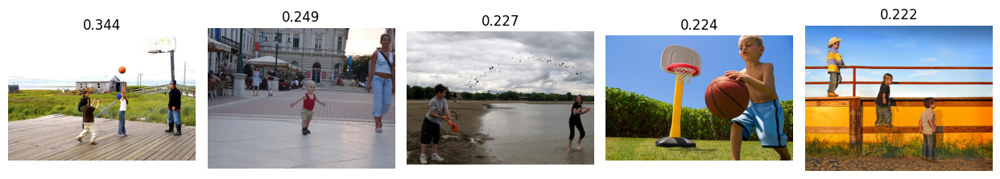

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- A tan dog runs through the brush . --------------------



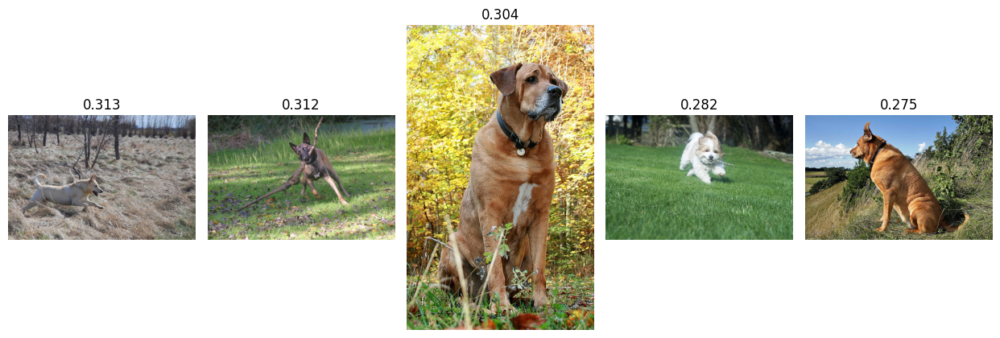

Embedding texts (CLIP):   0%|          | 0/1 [00:00<?, ?it/s]


-------------------- Three men on mountain bikes go over a sand hill . --------------------



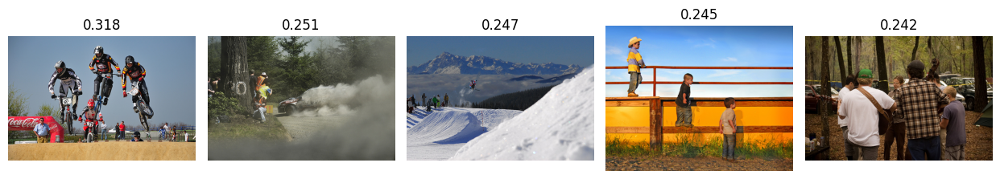

In [73]:
for text in text_test_sample:
    get_picture_clip(text)

<b>Вывод по разделу "Использование модели CLIP от OPEN AI"</b>

Визульная оценка результатов работы модели CLIP показала, что модель даёт более точный подбор картинок к тексту, тогда как **полносвязная нейросеть** чаще даёт более "шумные" результаты, подходящие только по общей тематике, несмотря на то, что по MSE она выигрывает на валидации.

Полносвязная нейросеть заметно цепляется за фон/общую обстановку (собаки, мотоциклы, люди), но хуже удерживает точный семантический смысл подписи. CLIP дает более осмысленный и «человеческий» подбор картинок, более того модель точно угадала исходную картинку по подписи. Таким образом, использование CLIP приоритетно при решении этой задачи.

## 8. Выводы

1. При обучении моделей лучший результат показала **полносвязная нейронная сеть**, обученная на объединённых эмбеддингах изображения (ResNet-50) и текста (all-MiniLM-L6-v2).

**Архитектура (слои):**  
3 полносвязных слоя с нелинейными функциями активации (ReLU) и dropout.  
Структура по числу нейронов: **[input → 64 → 32 → 16 → 1]**.  
Оптимизатор — Adam.

**Подобранные гиперпараметры обучения:**
- `batch_size = 16`
- `lr = 0.0005536804684537574`
- `weight_decay = 0.0008757592296896418`
- `num_epochs = 300`
- `dropout_1 = 0.3`, `dropout_2 = 0.05`, `dropout_3 = 0.05`

**Качество:** MSE = **0.0476**.  

Ошибка снизилась с 0.0637 до 0.0476, что даёт улучшение примерно **на 25%** относительно бейзлайна.

2. Дополнительно была протестирована предобученная мультимодальная модель **CLIP** в zero-shot режиме (без дообучения на данных задачи).  
На той же валидации **CLIP (zero-shot)** показывает **MSE ≈ 0.0563**, то есть работает на уровне лучших классических моделей, но при этом не требует обучения. По чистой метрике MSE он уступает дообученной полносвязной нейросети.


3. **Подбор изображений по описанию (качественный анализ)**

- **CLIP** даёт более «человеческий» подбор: выданные изображения хорошо соответствуют контексту описания, в топ-результаты часто попадают оригинальные изображения, наиболее точно совпадающие с текстом.
- Обученная **полносвязная нейросеть** чаще даёт шумные результаты: модель правильно улавливает общий фон (животные, люди, велосипеды и т.п.), но хуже попадает в точную ситуацию и взаимодействие объектов. Тем не менее, с учётом небольшого размера обучающего датасета полученный результат можно считать неплохим.

4. **Оценка реализуемости сервиса**

Базовый сервис поиска фотографий по текстовому описанию **уже реалистичен**: для простых пользовательских запросов и полносвязная нейросеть, и CLIP возвращают осмысленные, визуально релевантные результаты.

**Ограничения:**
- Для достижения высокого уровня точности при самостоятельном обучении классификатора понадобится более сложная архитектура и существенно больший объём обучающих данных и вычислительных ресурсов.
- С точки зрения финансовой и инженерной целесообразности разумнее опираться на предобученный **CLIP**, который уже хорошо улавливает контекст описания в zero-shot режиме.

Перспективное направление развития — попробовать ансамбль из **CLIP** и дообученной «головы» (например, дополнительного линейного слоя или небольшой MLP), чтобы совмещать сильные стороны предобученной модели и адаптации под конкретную задачу.
